For my final project, I worked to create a program that solves the one-dimensional Schrodinger equation for a finite barrier. The Schrodinger equation is:

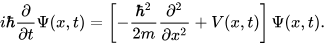

The scientific goal of this was to make a simplified model of a nuclear fusion reaction between two nuclei to calculate the probability of fusion given the nuclear properties of both. That is, in order for nuclear fusion to be achieved, the energy of the system must be large enough to overcome the Coulomb barrier between the nuclei. The Coulomb barrier is the potential energy caused by the electric charge of the  nuclei and is calculated as such:

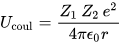

Even for very high energy nuclei, the energy level of the system will still generally be lower than this potential energy barrier, however, quantum mechanics allows for wavefunctions to "tunnel" through otherwise classically forbidden spaces. As such, some percentage of the wavefunction will be in this classically forbidden region, which corresponds to the probability of fusion.

As such, the process followed in this model is:


1.   Calculating the Coulomb barrier between two nuclei
2.   Establishing parameters for a simulation of the time-dependent Schrodinger equation.
3.   Simulating and animating the interaction of the time-dependent wavefunction with the finite wall presented by Coulomb barrier.
4.   Calculating the maximum probability of tunneling given the parameters.


This model is a highly simplified tool, given that these nuclear interactions are in reality three dimensional, but it can give some perspective into the suitability of different nuclei fusing with each other and demonstrates the ability to model quantum probabilistic systems in Python.

Some of the numerical methods used in this project are solving differential equations, here done with the Runge-Kutta 4 method, and integrating data, which is used to make a cumulative distribution function to calculate the maximum probabilities.



# **1. Calculating the Coulomb barrier between two nuclei**

In order to caclulate the Coulomb barrier between two nuclei, we need the Z values and nuclear radius values to perform this calculation. For this project, I referenced I. Angeli, K.P. Marinova, "Table of experimental nuclear ground state charge radii: An update" (2013, https://doi.org/10.1016/j.adt.2011.12.006), which has tabulated data for experimentally determined nuclear radii for different isotopes. The data is manually imported below into a Pandas DataFrame to be accessed later on.


In [3]:
# Import packages
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.animation import FuncAnimation
from IPython.display import display, HTML

# Create a table of experimental values of nuclear radii for light nuclei
# Source Angeli, Marinova (2013)

Z_A = [
    (1,1),
    (1,2),
    (1,3),
    (2,3),
    (2,4),
    (2,6),
    (2,8),
    (3,6),
    (3,7),
    (3,8),
    (3,9),
    (3,11),
    (4,7),
    (4,9),
    (4,10),
    (4,11),
    (5,10),
    (5,11),
    (6,12),
    (6,13),
    (6,14),
    (7,14),
    (7,15),
    (8,16),
    (8,17),
    (8,18),
    (9,19),
    (10,17),
    (10,18),
    (10,19),
    (10,20),
    (10,21),
    (10,22),
    (10,23),
    (10,24),
    (10,25),
    (10,26),
    (10,28),
    (11,20),
    (11,21),
    (11,22),
    (11,23),
    (11,24),
    (11,25),
    (11,26),
    (11,27),
    (11,28),
    (11,29),
    (11,30),
    (11,31),
    (12,24),
    (12,25),
    (12,26)
]

element_vals = []
Z_vals = []
A_vals = []

for i in range(len(Z_A)):
    Z = Z_A[i][0]
    A = Z_A[i][1]

    Z_vals.append(Z)
    A_vals.append(A)

    if Z == 1:
      element_vals.append('H')
    elif Z == 2:
      element_vals.append('He')
    elif Z == 3:
      element_vals.append('Li')
    elif Z == 4:
      element_vals.append('Be')
    elif Z == 5:
      element_vals.append('B')
    elif Z == 6:
      element_vals.append('C')
    elif Z == 7:
      element_vals.append('N')
    elif Z == 8:
      element_vals.append('O')
    elif Z == 9:
      element_vals.append('F')
    elif Z == 10:
      element_vals.append('Ne')
    elif Z == 11:
      element_vals.append('Na')
    elif Z == 12:
      element_vals.append('Mg')


R_vals = np.array([
    0.8783,
    2.1421,
    1.7591,
    1.9661,
    1.6755,
    2.0660,
    1.9239,
    2.5890,
    2.4440,
    2.3390,
    2.2450,
    2.4820,
    2.6460,
    2.5190,
    2.3550,
    2.4630,
    2.4277,
    2.4060,
    2.4702,
    2.4614,
    2.5025,
    2.5582,
    2.6058,
    2.6991,
    2.6932,
    2.7726,
    2.8976,
    3.0413,
    2.9714,
    3.0082,
    3.0055,
    2.9695,
    2.9525,
    2.9104,
    2.9007,
    2.9316,
    2.9251,
    2.9642,
    2.9718,
    3.0136,
    2.9852,
    2.9936,
    2.9735,
    2.9769,
    2.9928,
    3.0136,
    3.0400,
    3.0922,
    3.1180,
    3.1704,
    3.0570,
    3.0284,
    3.0337
]) * 10**-15 # [m]

m_vals = []
full_isotope_vals = []

for i in range(len(Z_A)):

  # Rewrite an isotope column
  full_isotope = str(A_vals[i]) + element_vals[i]
  full_isotope_vals.append(full_isotope)

  # Calculate the number of protons and neutrons
  p = Z_vals[i]
  n = A_vals[i] - p

  # Calculate nuclear mass based on these counts and particle masses
  mp = 1.67262192369e-27 # [kg]
  mn = 1.674927498e-27 # [kg]
  m = (p * mp) + (n * mn)
  m_vals.append(m)


nuclear_data = pd.DataFrame({"Element" : element_vals,
                             "Isotope" : full_isotope_vals,
                             "Z" : Z_vals,
                             "A" : A_vals,
                             "Nuclear Radius (m)" : R_vals,
                             "Nuclear Mass (kg)" : m_vals})
nuclear_data

,Element,Isotope,Z,A,Nuclear Radius (m),Nuclear Mass (kg)
0,H,1H,1,1,8.783000e-16,1.672622e-27
1,H,2H,1,2,2.142100e-15,3.347549e-27
2,H,3H,1,3,1.759100e-15,5.022477e-27
3,He,3He,2,3,1.966100e-15,5.020171e-27
4,He,4He,2,4,1.675500e-15,6.695099e-27
5,He,6He,2,6,2.066000e-15,1.004495e-26
6,He,8He,2,8,1.923900e-15,1.339481e-26
7,Li,6Li,3,6,2.589000e-15,1.004265e-26
8,Li,7Li,3,7,2.444000e-15,1.171758e-26
9,Li,8Li,3,8,2.339000e-15,1.339250e-26


This next cell defines a function that can extract the relevant nuclear data from our DataFrame in order to calculate the Coulomb Barrier.

In [4]:
# Define function to process data from the nuclear_data DataFrame for a given isotope
def element_name_processor(isotope):
  digit_index = next((i for i,
                      char in enumerate(isotope) if char.isalpha()),
                     len(isotope))

  # Separate letters and numbers
  A = int(isotope[:digit_index])
  element = isotope[digit_index:]

  # Extract values
  Z = nuclear_data[(nuclear_data['Element'] == element) & (nuclear_data['A'] == A)]['Z'].values[0]
  R = nuclear_data[(nuclear_data['Element'] == element) & (nuclear_data['A'] == A)]['Nuclear Radius (m)'].values[0]
  m = nuclear_data[(nuclear_data['Element'] == element) & (nuclear_data['A'] == A)]['Nuclear Mass (kg)'].values[0]

  return A,Z,R,m

This cell actually calculates the Coulomb barrier based on user-inputs for desired nuclei to be studied. The value for the Coulomb barrier is calculated in standard SI units, being Joules here and is propagated later in said units. However, in quantum mechanics problems, it is generally conventional to work in some variation of electon-volts (eV), and here the relevant order of magnitude is MeV, so we present the Coulomb barrier in MeV here for reference.

Note, these values are approximate, given simplifications in the radius calculations from above, but are in the accepted order of magnitude for Coulomb barriers. For example, the Coulomb barrier between deuterium (2H) and tritium (3H) (the two isotopes best suited for controlled nuclear fusion) is 0.1 MeV (https://www6.lehigh.edu/~eus204/lab/PCL_fusion.php) and our calculated result is 0.369 MeV.

In [5]:
# Define step potential from Coulomb barrier
epsilon0 = 8.8541878128e-12 # [F/m]
elementary_charge = 1.602176634e-19 # [C]
isotope1 = input('Input isotope 1 (e.g. "1H" for hydrogen-1): ')
A1, Z1, R1, m1 = element_name_processor(isotope1)
isotope2 = input('Input isotope 2: ')
A1, Z2, R2, m2 = element_name_processor(isotope2)
r = R1 + R2
Coulomb_barrier = Z1 * Z2 * elementary_charge**2 / (4 * np.pi * epsilon0 * r)
Coulomb_barrier_MeV = Coulomb_barrier * 6.242e12 # [J to MeV]
print(Coulomb_barrier_MeV, "MeV")

Input isotope 1 (e.g. "1H" for hydrogen-1): 1H
Input isotope 2: 2H
0.47678380617524535 MeV


The cell below rescales the mass and Coulomb barrier values so that they can be handled by the simulation. Note this is a limitation on accuracy, but given the scale of the values, the simulation and animation was not well suited for them. Instead, by rescaling all values linearly, the resultant relative probabilities will be proportional to the actual values and the simulation will still be able to give insight onto which nuclei are more or less likely to fuse given a certain momentum.

In [6]:
m_scaling = 2e28
m1_scaled = m1*m_scaling

coul_scaling = 1e12
coul_scaled = Coulomb_barrier * coul_scaling

# **2. Establishing parameters for a simulation of the time-dependent Schrodinger equation**

This cell defines the crux of the under-the-hood operations of the simulation, which defines functions for the solutions to the Schrodinger equation in differential form, allows for complex plotting, and simulates and animates the results. The differential equations are solved by the **Runge-Kutta 4th Order Method,** which we learned in class. The general outline and some of these functions were modified from an open source quantum mechanics simulation code, written by a former UPenn physics post-doc, Ben Land (ttps://ben.land/post/2022/03/09/quantum-mechanics-simulation/). I have modified his codes to take in the scaled mass and Coulomb barrier values, as well as some other minor tweaks to improve plotting readability and presentation.

In [9]:
# Functions modified from https://ben.land/post/2022/03/09/quantum-mechanics-simulation/

# Set arbitrary space to iterate over
x = np.linspace(-10,10,10000)
deltax = x[1] - x[0]

# Normalizing the wavefunction
def norm(phi):
  norm = np.sum(np.square(np.abs(phi))) * deltax
  return phi / np.sqrt(norm)

# Creating a complex plot
def complex_plot(x,y, prob = True, **kwargs):
  # Separate real and imaginary spaces
  real = np.real(y)
  imag = np.imag(y)

  # Plot real and imaginary values
  a,*_ = plt.plot(x, real, label = 'Re', **kwargs)
  b,*_ = plt.plot(x, imag, label = 'Im', **kwargs)

  # Conditonally plot probability distribution
  if prob:
    p,*_ = plt.plot(x, np.abs(y), label = '$\sqrt{P}$')
    return a,b,p
  else:
    return a,b

# Defining the quantized wave packet
def wave_packet(pos=0, mom=0, sigma=2e-1):
  return norm(np.exp(-1j*mom*x)*np.exp(-np.square(x-pos)/sigma/sigma,dtype=complex))

# Define Laplacian operator
def d_dxdx(phi,x=x):
  dphi_dxdx = -2*phi
  dphi_dxdx[:-1] += phi[1:]
  dphi_dxdx[1:] += phi[:-1]

  return dphi_dxdx / deltax

# Define partial derivative in time operator
def d_dt(phi, hbar=1, m=m1_scaled, V = 0):
  return 1j*hbar/2/m * d_dxdx(phi) - 1j*V*phi/hbar

# Define function for the Runge-Kutta 4 method
def rk4(phi, dt, **kwargs):
  k1 = d_dt(phi, **kwargs)
  k2 = d_dt(phi+dt/2*k1, **kwargs)
  k3 = d_dt(phi+dt/2*k2, **kwargs)
  k4 = d_dt(phi+dt*k3, **kwargs)
  return phi + dt/6*(k1+2*k2+2*k3+k4)

# Define function for simulation of the wavefunction
def simulate(phi_sim,
             method='rk4',
             V=0,
             steps=100000,
             dt=1e-1,
             condition=None,
             normalize=True,
             save_every=100,
             progress = False):
    simulation_steps = [np.copy(phi_sim)]
    probabilities = [np.abs(phi_sim)**2]  # Store probabilities

    print('Simulating wavefunction \n')

    for i in range(steps):
        if (i % (steps / 10) == 0) & progress:
            print((i / steps) * 100, '%')
        if method == 'rk4':
            phi_sim = rk4(phi_sim, dt, V=V)
        else:
            raise Exception(f'Unknown method {method}')
        if condition:
            phi_sim = condition(phi_sim)
        if normalize:
            phi_sim = norm(phi_sim)
        if save_every is not None and (i+1) % save_every == 0:
            simulation_steps.append(np.copy(phi_sim))
            probabilities.append(np.abs(phi_sim)**2)  # Store probabilities

    return simulation_steps, np.array(probabilities)

# Define animation function that makes use of matplotlib.animate.FuncAnimation
def animate(simulation_steps, isotope1, isotope2, init_func=None):
  fig = plt.figure()
  re,im,prob = complex_plot(x,simulation_steps[0])

  if init_func:
      init_func()
  plt.legend(loc = 'lower left')
  plt.title('Simulation of Time Dependent Solution to the Schrodinger Equation for \n Nuclear Interaction between {} and {}'.format(isotope1, isotope2))

  def animate(frame):
      prob.set_data((x, np.abs(simulation_steps[frame])))
      re.set_data((x, np.real(simulation_steps[frame])))
      im.set_data((x, np.imag(simulation_steps[frame])))
      return prob,re,im

  anim = FuncAnimation(fig, animate, frames=int(len(simulation_steps)), interval=50)
  plt.close()

  return anim

# **3. Simulating and animating the interaction of the time-dependent wavefunction with the finite wall presented by Coulomb barrier**

This cell sets the actual simulation parameters and animates the wavefunction given the parameters set by the nuclear data and Coulomb barrier.

In [ ]:
left_bound = 1.4e0
right_bound = 1.6e0

barrier_weak_potential = np.where((x>left_bound)&(x<right_bound),coul_scaled,0)

sim_barrier_mom, probabilities = simulate(wave_packet(mom=-5e1),V=barrier_weak_potential,steps=50000, dt = 1e-1, save_every=500, progress = True)

def barrier_init():
    plt.gcf().axes[0].axvspan(left_bound, right_bound, alpha=0.2, color='salmon', label = 'Coulomb Barrier: {:.3f} MeV'.format(Coulomb_barrier_MeV))
    plt.xlim(-5,5)

anim = animate(sim_barrier_mom, isotope1 = isotope1, isotope2= isotope2, init_func=barrier_init)
HTML(anim.to_jshtml())

Simulating wavefunction 

0.0 %
10.0 %
20.0 %
30.0 %
40.0 %
50.0 %
60.0 %
70.0 %
80.0 %
90.0 %


Looking at the animation above and if we take the example of deuterium-tritium (2H,3H) fusion, we can actually see a small wave packet transmit to the other side of the Coulomb barrier, corresponding to the non-negligible probability of quantum tunneling and hence nuclear fusion for this nuclear interaction. For some nuclear pairs, the Coulomb barrier will be so high that the probabilities of transmission will not even be discernible at the given reaction temperature, which makes physical sense given the high energy required to fuse heavy nuclei.

# **4. Calculating the maximum probability of tunneling given the parameters**

Below, we define a function that uses the numerical method **Trapezoidal Integration** that is used to integrate all of the probabilities of tunneling in a given simulation. Integrating over a probability density function like this over a particular range results in what is called a cumultative distrubtion function (CDF). Using the last value in the CDF over the range that has been simulated gives the maximum probability of a result being in the given range, that is, of passing through the Coulomb barrier.

In [10]:
# Need to define integral function so that we can integrate the total probability of tunnelling
def trapezoidal_integration(array, xvals):
    a = len(array)

    # Initialize the integrated array with zeros
    integrated_array = np.zeros(a, float)

    # loop over time values
    for k in range(1, a):
        dx = xvals[k] - xvals[k-1]                       # time interval
        integrated_array[k] = integrated_array[k-1] + 0.5*dx*(array[k] + array[k-1])   # trapezoid rule

    return integrated_array

In [ ]:
tunneling_prob_by_frame = []
cdfs = []

N = len(probabilities)

for i in range(N):
  cdf = trapezoidal_integration(probabilities[i][x>right_bound], x[x>right_bound])
  cdfs.append(cdf)

  cumulative_tunneling_prob = cdf[-1] * 100
  tunneling_prob_by_frame.append(cumulative_tunneling_prob)

tunneling_prob_by_frame = np.array(tunneling_prob_by_frame)
max_prob = tunneling_prob_by_frame.max()
print('The maximum probability of quantum tunneling given the starting momentum is {:.3f}%'.format(max_prob))

The maximum probability of quantum tunneling given the starting momentum is 0.174%


In the following plots, we can visualize the overlay of the probability density function with the cumulative distribution functions to get a clearer picture of the fusion probability for the specified animation frame with the highest overall probability.

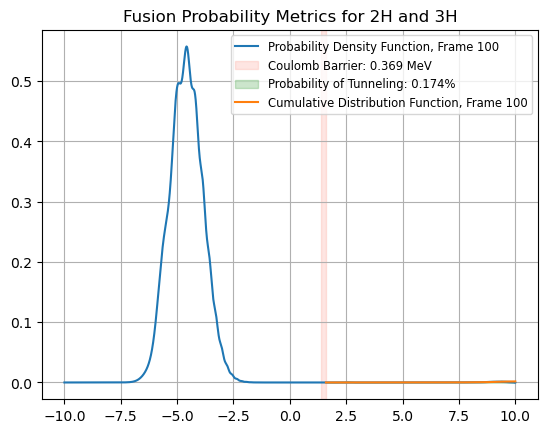

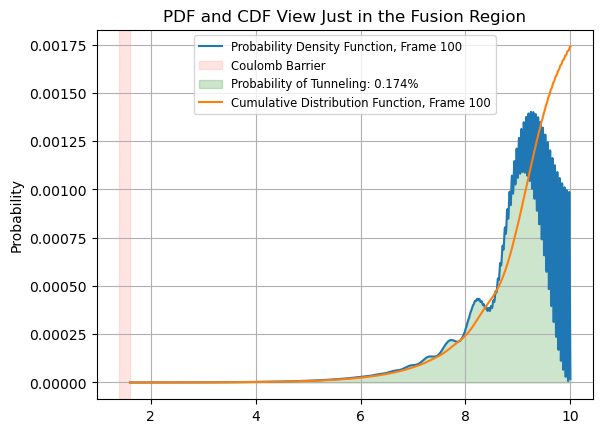

In [ ]:
# Select out the frame index that contains the highest probability of fusion
index = pd.DataFrame({'i': range(N),'prob' : tunneling_prob_by_frame}).sort_values('prob', ascending = False)['i'].values[0]

# Plot pdf, cdf over whole range
plt.plot(x,probabilities[index], label = 'Probability Density Function, Frame {}'.format(index))
plt.axvspan(left_bound, right_bound, alpha=0.2, color='salmon', label = 'Coulomb Barrier: {:.3f} MeV'.format(Coulomb_barrier_MeV))
plt.fill_between(x[x > right_bound], y1=0, y2=probabilities[30][x > 1.6], alpha=0.2, color='green', label = 'Probability of Tunneling: {:.3f}%'.format(max_prob))
plt.plot(x[x>right_bound], cdfs[index], label= 'Cumulative Distribution Function, Frame {}'.format(index))
plt.title('Fusion Probability Metrics for {} and {}'.format(isotope1, isotope2))
plt.legend(fontsize = 'small')
plt.grid()
plt.show()
plt.close()

# Plot over a smaller range so that the cdf is more visible
plt.plot(x[x > right_bound],probabilities[index][x>right_bound], label = 'Probability Density Function, Frame {}'.format(index))
plt.axvspan(left_bound, right_bound, alpha=0.2, color='salmon', label = 'Coulomb Barrier')
plt.fill_between(x[x > right_bound], y1=0, y2=probabilities[index][x > right_bound], alpha=0.2, color='green', label = 'Probability of Tunneling: {:.3f}%'.format(max_prob))
plt.plot(x[x>right_bound], cdfs[index], label= 'Cumulative Distribution Function, Frame {}'.format(index))
plt.ylabel('Probability')
plt.title('PDF and CDF View Just in the Fusion Region')
plt.legend(fontsize = 'small')
plt.grid()
plt.show()

From the plots above, we can see that the overall probability of fusion at the given energy level is still fairly low, but because of the quantum tunneling effect, nonzero. This is an exciting result to see, given that physically we know that tunneling is the operative phenomenon that allows for fusion to be achievable at under engineerable conditions, and even in the Sun.

# **Integrating processes into a single user-friendly function**

Now that we've established an extended model for this process, I have compiled it all into a single function called fusion_probability, which takes in two isotopes, momentum, and a condition of whether or not to show the animation, and runs through the full simulation internally, providing the fusion probability under those conditions. Below, we will use this function both to iterate one reaction over different momenta and also to iterate over the different combinations of Hydrogen, Helium, and Lithium isotopes, the three most commonly studied fusion reactants, to find out which combination have the highest probability of fusing.

In [7]:
def fusion_probability(momentum = -5e1,
                       isotope1 = None,
                       isotope2 = None,
                       animation = False):

  '''
  Concise function that solves the Schrodinger equation for the nuclear interaction
  between two nuclei. The function calculates the Coulomb barrier between the given
  nuclei, which can either be designated as parameters or by terminal input upon
  calling the function. The function then simulates the time-dependent solution to
  the Schrodinger equation, with the conditional option of showing an animation of
  the propagation of the wavefunction and its respective probability function through
  space. Finally, the function calculates and returns the maximum probability of quantum
  tunneling as a proxy for probability of fusion, given the simulation parameters.

  ---------

  Arguments:
      isotope1 (str): Name of first isotope in the nuclear interaction (e.g. 1H).
                      Default None
      isotope2 (str): Name of second isotope in the nuclear interaction.
                      Default None
      animation (bool): Boolean to select whether or not to animate results.
                      Default False

  Returns:
      max_prob (float): Maximum probability of quantum tunneling given simulation parameters.
  '''

  # Set isotopes
  if isotope1 is None:
    isotope1 = input('Input isotope 1 (e.g. "1H" for hydrogen-1): ')

  if isotope2 is None:
    isotope2 = input('Input isotope 2: ')

  # Extract nuclear data from the isotopes
  A1, Z1, R1, m1 = element_name_processor(isotope1)
  A2, Z2, R2, m2 = element_name_processor(isotope2)

  # Define cumulative radius
  r = R1 + R2

  # Calculate Coulomb barrier in Joules and MeV
  Coulomb_barrier = Z1 * Z2 * elementary_charge**2 / (4 * np.pi * epsilon0 * r)
  Coulomb_barrier_MeV = Coulomb_barrier * 6.242e12 # [J to MeV]
  print('Coulomb barrier between {} and {}: {:.3f} MeV \n'.format(isotope1, isotope2, Coulomb_barrier_MeV))

  # Rescale values so that the simulation can effectively run
  m_scaling = 2e28
  m1_scaled = m1*m_scaling
  coul_scaling = 1e12
  coul_scaled = Coulomb_barrier * coul_scaling

  # Set arbitrary space to iterate over
  x = np.linspace(-10,10,10000)
  deltax = x[1] - x[0]

  # Simulate time-dependent wavefunction
  left_bound = 1.4e0
  right_bound = 1.6e0

  # Set potential barrier for scaled Coulomb barrier
  barrier_weak_potential = np.where((x>left_bound)&(x<right_bound),coul_scaled,0)

  # Simulate the solutions to the time-dependent Schrodinger equation
  sim_barrier_mom, probabilities = simulate(wave_packet(mom=momentum),
                                            V=barrier_weak_potential,
                                            steps=50000,
                                            dt = 1e-1,
                                            save_every=500,
                                            progress = True)

  # Conditionally animate the simulation
  if animation:

    # Define barrier plotting
    def barrier_init():
        plt.gcf().axes[0].axvspan(left_bound,
                                  right_bound,
                                  alpha=0.2,
                                  color='salmon',
                                  label = 'Coulomb Barrier: {:.3f} MeV'.format(Coulomb_barrier_MeV))
        plt.xlim(-5,5)

    # Animate and show results
    anim = animate(sim_barrier_mom,
                   isotope1=isotope1,
                   isotope2=isotope2,
                   init_func=barrier_init)
    display(HTML(anim.to_jshtml()))


  # Create empty lists to store frame by frame data
  tunneling_prob_by_frame = []
  cdfs = []

  N = len(probabilities)

  # Iterate over every frame to calculate a cumulative distribution function (CDF) and maximum tunneling probability
  for i in range(N):

    # Use trapezoidal integration to calculate a CDF of tunneling probabilities
    cdf = trapezoidal_integration(probabilities[i][x>right_bound], x[x>right_bound])
    cdfs.append(cdf)

    # Find the maximum tunneling probability
    cumulative_tunneling_prob = cdf[-1]
    tunneling_prob_by_frame.append(cumulative_tunneling_prob)

  # Convert the probabilities list to an array
  tunneling_prob_by_frame = np.array(tunneling_prob_by_frame)

  # Extract and return the maximum probability of tunneling across all frames
  max_prob = tunneling_prob_by_frame.max()
  print("The probability of fusion between these two nuclei under the given parameters is {:.3e}".format(max_prob))
  return max_prob

In [11]:
# Call for example function of
max_prob = fusion_probability(isotope1= '2H',
                              isotope2 = '3H',
                              animation = True)

Coulomb barrier between 2H and 3H: 0.369 MeV 

Simulating wavefunction 

0.0 %
10.0 %
20.0 %
30.0 %
40.0 %
50.0 %
60.0 %
70.0 %
80.0 %
90.0 %


The probability of fusion between these two nuclei under the given parameters is 7.297e-03


Using this function, we can calculate fusion probabilities as a function of momentum. Here we will use a logarithmic scale to get a wider perspective and test for standard deuterium-tritium fusion.

In [ ]:
# Create logspace
momenta = np.linspace(-1e1, -1e2, 10)

# Iterate over the different momenta
probs = []
for momentum in momenta:
    prob = fusion_probability(momentum = momentum,
                              isotope1 = '2H',
                              isotope2 = '3H',
                              animation = False)
    probs.append(prob)

Coulomb barrier between 2H and 3H: 0.369 MeV 

Simulating wavefunction 

0.0 %
10.0 %


In [ ]:
# Plot results
plt.scatter(np.abs(momenta), probs, color = 'steelblue')
plt.plot(np.abs(momenta), probs, color = 'steelblue')
plt.xlabel('Momentum')
plt.ylabel('Probability')
plt.title('Fusion Probability for Deuterium-Tritium Fusion as a Function of Momentum')
plt.grid()

In the plot above, we see how the probability of fusion scales follows a logisitic curve wherein the probability increases as a function of momentum, which is itself a proxy for energy in this model. It should be noted that the momentum here is along the scaled non-physical unit system that we established for the model to be able to run well, but the relative scaling from point to point on the plot above does show the actual relationship between momentum and fusion probability. We see that probabilities of fusion taper off at 100%, which is the sensible upper limit for any probability. The practical question that this can be applied to then, is establishing the minimum energy threshhold to sustain a fusion reaction. As such, for controlled fusion experiments, there needs to be a balance between raising the energy to a high enough level that enough nuclei fuse, but within a temperature limit that can be supported by material and cost constraints.

Below, we iterate over all of the combinations of the main fusion-relevant isotopes of hydrogen, helium, and lithium. As the three lightest elements, they also are the energetically "easiest" to fuse.

In [ ]:
import itertools

# Filter nuclear_data for practically studied isotopes of H, He, and Li
fusion_relevant_isotopes = ['1H','2H','3H','3He','4He','6Li','7Li']
H_He_Li = nuclear_data[nuclear_data['Isotope'].isin(fusion_relevant_isotopes)]

pair_set = set()
comb_probs = []

# Generate pairs of isotopes, including self-matches
for i1, i2 in itertools.product(H_He_Li['Isotope'], repeat=2):
    isotope_pair = tuple(sorted([i1, i2]))

    # Avoid repeating combinations
    if isotope_pair in pair_set:
        continue

    # Otherwise, include the pair in the set
    pair_set.add(isotope_pair)

    # Run the fusion_probability function for the given isotope pair
    max_prob = fusion_probability(momentum = -5e1, isotope1=i1, isotope2=i2, animation = False)
    comb_probs.append(max_prob)


    print('\n ------------------- \n')

# Create a DataFrame to store the results for every pair combination and save it
pair_df = pd.DataFrame({'Pair': list(pair_set), 'Fusion Probability': comb_probs}).sort_values('Fusion Probability', ascending=False)
pair_df.to_csv('./probabilities_by_isotope_pair.csv')

# Establish the optimal pairing for fusion probability
optimal_pair = pair_df['Pair'].values[0]
highest_prob = pair_df['Fusion Probability'].values[0]
print('The pair of nuclei with the highest probability of nuclear fusion under the given simulation parameters are {} and {}, \n with a maximum probability of fusion of {:.3e}'.format(optimal_pair[0], optimal_pair[1], highest_prob))


Coulomb barrier between 1H and 1H: 0.820 MeV 

Simulating wavefunction 

0.0 %
10.0 %
20.0 %
30.0 %
40.0 %
50.0 %
60.0 %
70.0 %
80.0 %
90.0 %
The probability of fusion between these two nuclei under the given parameters is 1.882e-13

 ------------------- 

Coulomb barrier between 1H and 2H: 0.477 MeV 

Simulating wavefunction 

0.0 %
10.0 %
20.0 %
30.0 %
40.0 %
50.0 %
60.0 %
70.0 %
80.0 %
90.0 %
The probability of fusion between these two nuclei under the given parameters is 2.396e-06

 ------------------- 

Coulomb barrier between 1H and 3H: 0.546 MeV 

Simulating wavefunction 

0.0 %
10.0 %
20.0 %
30.0 %
40.0 %
50.0 %
60.0 %
70.0 %
80.0 %
90.0 %
The probability of fusion between these two nuclei under the given parameters is 1.759e-08

 ------------------- 

Coulomb barrier between 1H and 3He: 1.013 MeV 

Simulating wavefunction 

0.0 %
10.0 %
20.0 %
30.0 %
40.0 %
50.0 %
60.0 %
70.0 %
80.0 %
90.0 %
The probability of fusion between these two nuclei under the given parameters is 9.831

In having iterated over all of these combinations, we see that the fusion between 1H and 3H is the highest of all of these isotope pairings, in what is known as proton-capture. The orders of magnitude of all of these probabilities vary tremendously, ranging from 1e-3 to 1e-28, showing that for even very light nuclear reactions, the difference of a few nucleons in the nuclei at hand makes a significant difference in fusion probability. Below, we have the whole Data Frame containing the pair information and also two plots to help visualize the data, one with a linear scale for the probabilities as a function of the total number of nucleons in the interaction and the other with a logarithmic scale because so many orders of magnitude are covered in just this small sample of isotopes.

In [ ]:
pair_df

,Pair,Fusion Probability,A1,A2,A1 + A2
7,"(1H, 3H)",8.783652e-03,1,3,4
8,"(1H, 7Li)",1.739949e-03,1,7,8
13,"(2H, 3He)",1.841176e-04,2,3,5
1,"(3He, 3He)",2.396251e-06,3,3,6
2,"(3H, 7Li)",1.759353e-08,3,7,10
9,"(1H, 4He)",8.438873e-12,1,4,5
10,"(4He, 6Li)",1.419583e-12,4,6,10
14,"(2H, 6Li)",7.833093e-13,2,6,8
0,"(2H, 3H)",1.881651e-13,2,3,5
15,"(2H, 2H)",1.082056e-13,2,2,4


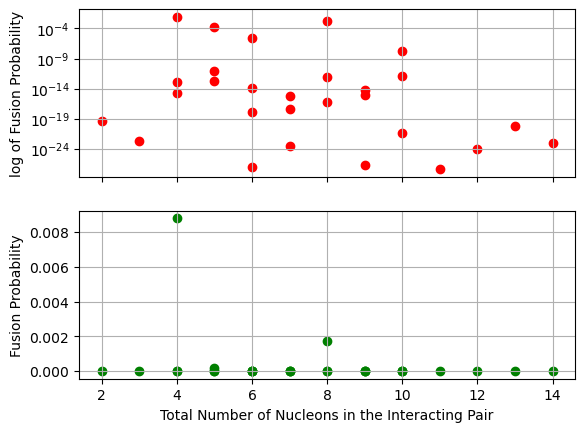

In [ ]:
# Extract the nuclear data from the pair_df Data Frame
A1s = []
A2s = []
Asums = []
for pair in pair_df['Pair']:
    i1 = pair[0]
    A1, Z1, R1, m1 =  element_name_processor(i1)
    A1s.append(A1)
    i2 = pair[1]
    A2, Z2, R2, m2 = element_name_processor(i2)
    A2s.append(A2)
    Asum = A1 + A2
    Asums.append(Asum)
pair_df['A1'] = A1s
pair_df['A2'] = A2s
pair_df['A1 + A2'] = Asums

# Create a figure with two subplots
fig, axs = plt.subplots(2, 1, sharex=True)

# Plot on the first subplot with logarithmic scale
axs[0].scatter(pair_df['A1 + A2'], pair_df['Fusion Probability'], color='red')
axs[0].set_yscale('log')
axs[0].set_ylabel('log of Fusion Probability')
axs[0].grid()

# Plot on the second subplot with linear scale
axs[1].scatter(pair_df['A1 + A2'], pair_df['Fusion Probability'], color='green')
axs[1].set_yscale('linear')
axs[1].set_ylabel('Fusion Probability')
axs[1].grid()

# Set x-axis label for both subplots
axs[-1].set_xlabel('Total Number of Nucleons in the Interacting Pair')

plt.show()